In [2]:
import os, sys
import warnings
from CRS_funcs import temporal_profile_for_practices, border, create_marker, display_plots, aggregate_plots, AT_diff_barchart, AT_stats
####### 
input_dir="time_series/NI/merged/"

# 2016-2019 time series of vegetation indices to identify cover crops (CC) and crop residue (CR) on ASA plots (treatment) vs Test plots (control):  
- Vegetation Indices: maximize separation of features of interest. Broadband vs narrowband.  
- Limited to indices using wavelengths/bands covered by Sentinel AND Landsat (can't use Sentinel's red-edge bands).  

## <b>Cover crops:</b> identify CC on ASA plots (with standing CR) from Test plots without CC (with grazed CR)  
- <b>Temporal window:</b> NOV to FEB - after postrera harvest, CC is planted and dies off by February in dry years (can last as long as May?)  
- <b>Spectral window:</b> choose bands-> indices measuring green/live/photosynthetically active vegetation vs brown/dead/non-photosynthetically active vegetation  
1) <b>Enhanced Vegetation Index 2 (EVI2)</b> = 2.5 * ( NIR - RED) / ( NIR + (2.4 * RED + 1.0 )    
2) <b>Green-Chlorophyll Vegetation Index (GCVI)</b> = (NIR – GREEN) / (NIR + GREEN)  
2) <b>Normalized Burn Ratio (NBR)</b> = (SWIR2-NIR1) / (SWIR2+NIR) 

<b> ASA with CC should have higher EVI & GCVI & NBR values than Test plots sans CC from NOV to FEB </b>


## <b>Crop residue:</b> differentiate ASA plots with standing crop residue from Test plots with grazed residue (leaving soil)  
- <b>Temporal window:</b> FEB to MAY - CR is left on both Test and ASA plots. Grazing occurs on Test, so once residue has been grazed on Test & CC dies on ASA around Feb, Test plot should have soil and ASA plot should have standing residue  
- <b>Spectral window:</b> soil and dead/dry veg look similar in visible and NIR parts of the spectrum, but lignin and cellulose in standing residue absorb SWIR2 light  
1) <b>Normalized Difference Tillage Index (NDTI)</b> = (SWIR1-SWIR2) / (SWIR1+SWIR2) First, the most prominent spectral difference between NPV and soil is the cellulose absorption feature in SWIR 2 wavelengths.   
2) <b>Normalized Burn Ratio (NBR)</b> = (SWIR2-NIR1) / (SWIR2+NIR) 

<b> ASA with CR should have higher NDTI & NBR values than Test plots sans CR from FEB to MAY </b>

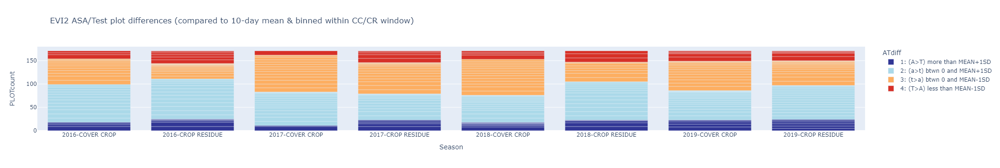

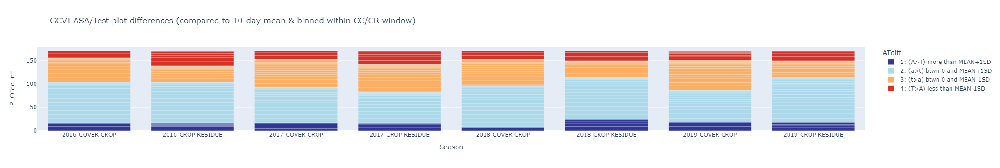

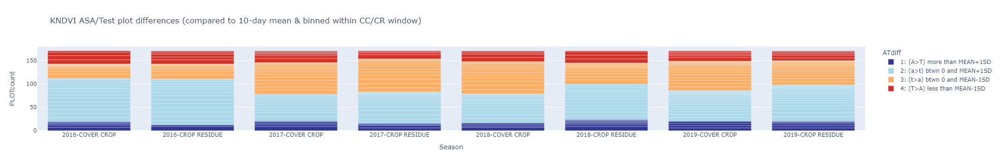

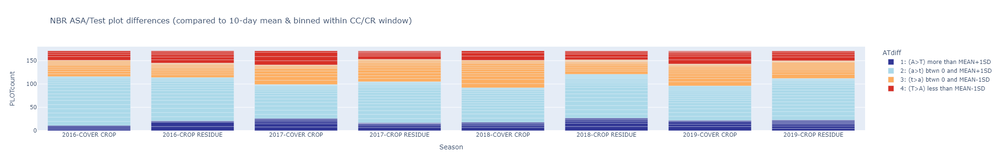

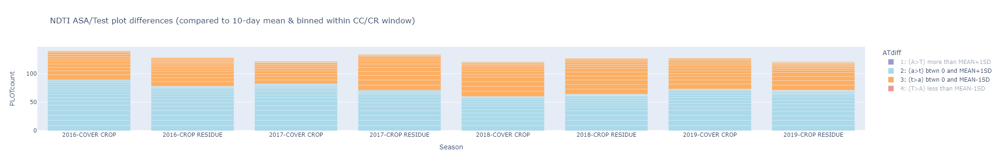

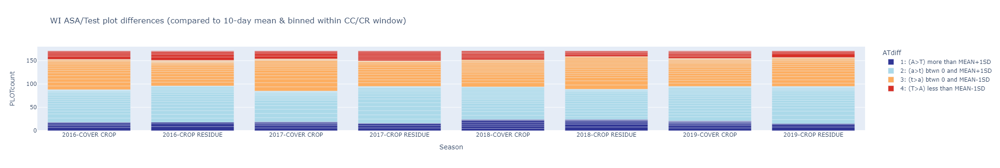

In [3]:
for dat in sorted(os.listdir(input_dir)):
        if dat.endswith('_merged_stats.csv'):
            AT_diff_barchart(input_dir + dat)

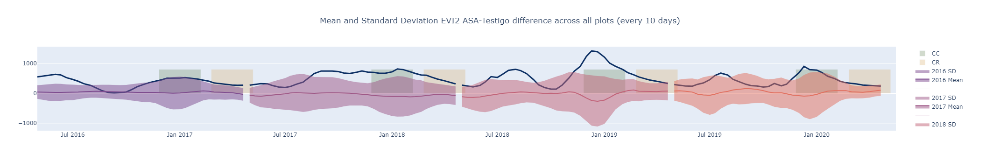

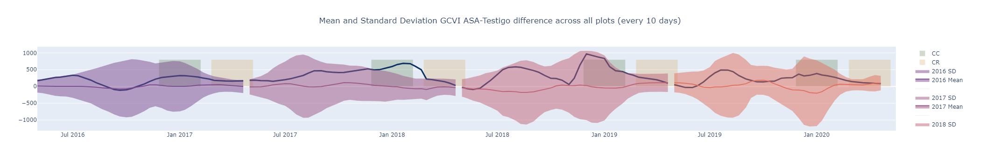

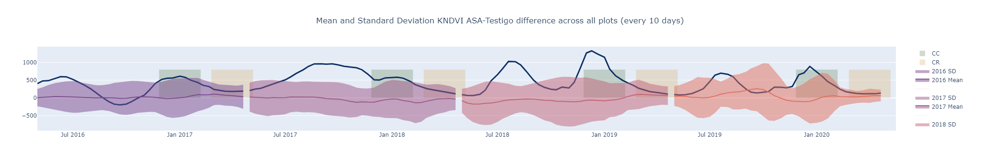

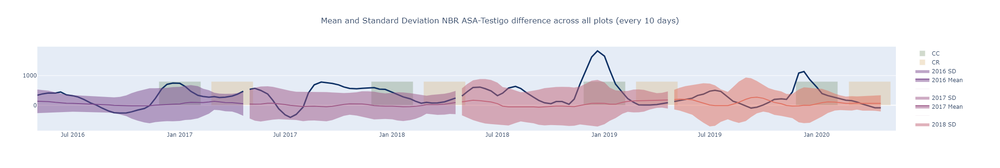

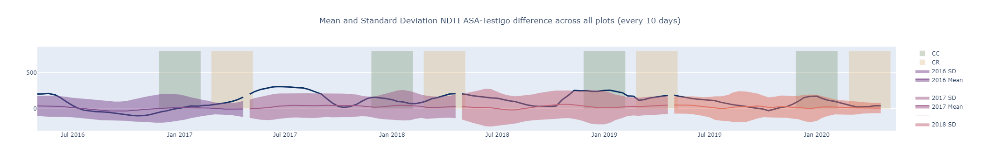

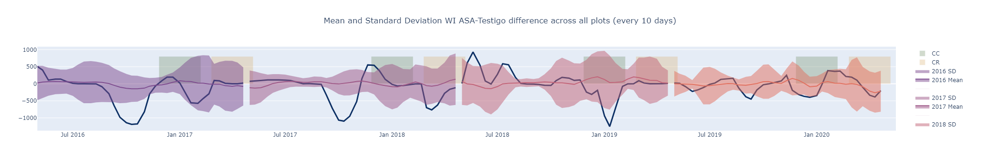

In [4]:
FieldID="NI_313"
##########################################
for i in sorted(os.listdir(input_dir)):
        if i.endswith('_merged.csv'):
            AT_stats(input_dir + i, FieldID)

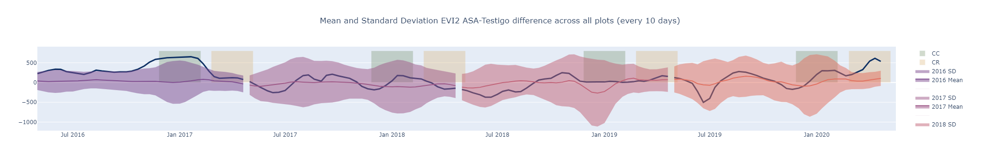

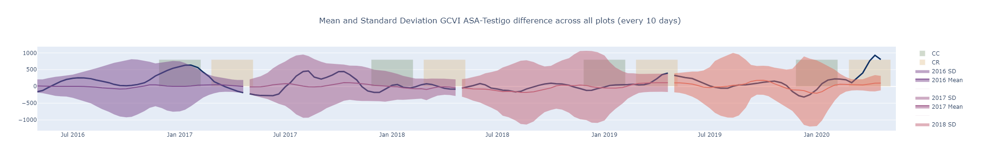

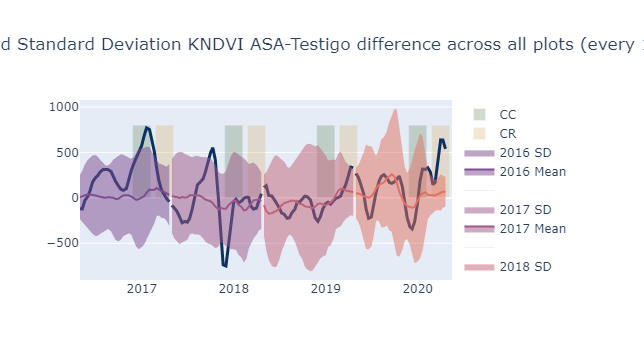

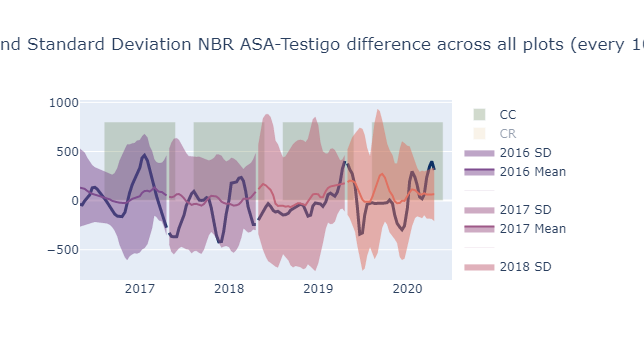

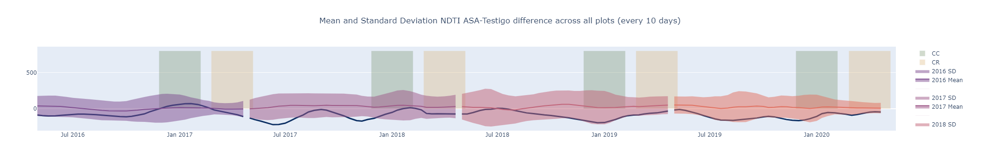

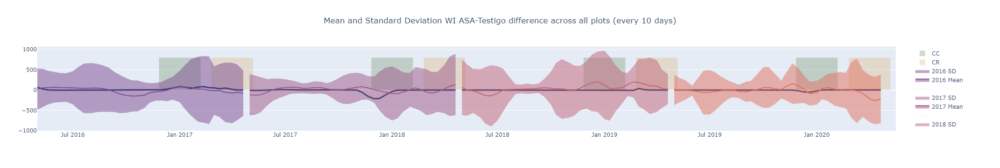

In [5]:
for i in sorted(os.listdir(input_dir)):
        if i.endswith('_merged.csv'):
            AT_stats(input_dir + i, "NI_407")

Nicaragua grids: '002225','002387','002388','002548','002549','002550'  
List of indices = ['evi2', 'gcvi', 'kndvi', 'ndti', 'wi', 'nbr']

Cultivo                           \
Temporada                              Postrera Primera Postrera Primera   
Ano                                        2016    2016     2017    2017   
ID_Prod Parcela Nom.Cob                                                    
NI_295  ASA     maíz-frijol-canavalia  Barbecho    Maiz   Frijol    Maiz   
        Testigo no                     Barbecho    Maiz   Frijol    Maiz   
NI_307  ASA     maíz-frijol-canavalia    Frijol    Maiz   Frijol    Maiz   
        Testigo no                       Frijol    Maiz   Frijol    Maiz   
NI_313  ASA     maíz-frijol-canavalia     Sorgo    Maiz   Frijol    Maiz   
        Testigo no                        Sorgo    Maiz   Frijol    Maiz   
NI_385  ASA     maíz-frijol-canavalia    Frijol    Maiz   Frijol    Maiz   
        Testigo no                       Frijol    Maiz   Frijol    Maiz   
NI_407  ASA     maíz-canavalia              NaN     NaN      NaN     NaN   
                maíz-frijol-canavalia    Frijol    Maiz   Frijol    Maiz   
        Testigo no                       Frijol    Maiz   Frijol    Maiz   

                                                                         
Temporada                             Postrera Primera Postrera Primera  
Ano                                       2018    2018     2019    2019  
ID_Prod Parcela Nom.Cob                                                  
NI_295  ASA     maíz-frijol-canavalia   Frijol    Maiz      NaN     NaN  
        Testigo no                      Frijol    Maiz      NaN     NaN  
NI_307  ASA     maíz-frijol-canavalia    Sorgo    Maiz     None    Maiz  
        Testigo no                       Sorgo    Maiz     None    Maiz  
NI_313  ASA     maíz-frijol-canavalia      NaN    Maiz    Sorgo    Maiz  
        Testigo no                         NaN    Maiz    Sorgo    Maiz  
NI_385  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz  
        Testigo no                      Frijol    Maiz   Frijol    Maiz  
NI_407  ASA     maíz-canavalia             NaN     NaN   Tomate     NaN  
                maíz-frijol-canavalia      NaN    Maiz      NaN    Maiz  
        Testigo no                         NaN    Maiz   Tomate    Maiz

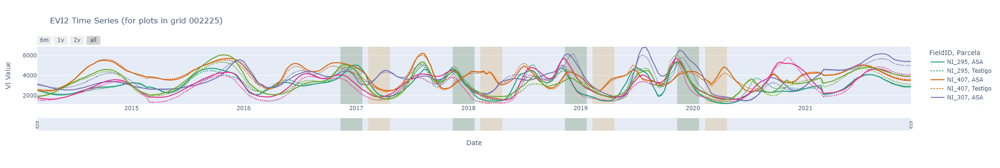

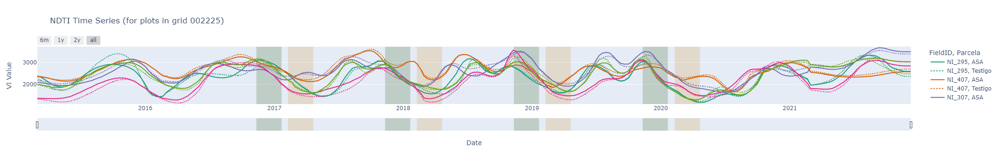

Map(center=[13.459634926000035, -86.52293229699995], close_popup_on_click=False, controls=(AttributionControl(…

In [5]:
display_plots('002225', ['evi2', 'nbr', 'ndti'])

Cultivo                                 \
Temporada                             Postrera Primera Postrera Primera         
Ano                                       2016    2016     2017    2017  2018   
ID_Prod Parcela Nom.Cob                                                         
NI_248  ASA     maíz-canavalia             NaN     NaN      NaN     NaN   NaN   
                maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz  Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz  Maiz   
NI_258  ASA     maíz-canavalia             NaN     NaN      NaN     NaN   NaN   
                maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz  Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz  Maiz   

                                                      
Temporada                                   Postrera  
Ano                                    2019     2019  
ID_Prod Parcela Nom.Cob                               
NI_248  ASA     maíz-canavalia          NaN     None  
                maíz-frijol-canavalia  Maiz      NaN  
        Testigo no                     Maiz     None  
NI_258  ASA     maíz-canavalia          NaN     None  
                maíz-frijol-canavalia  Maiz      NaN  
        Testigo no                     Maiz     None

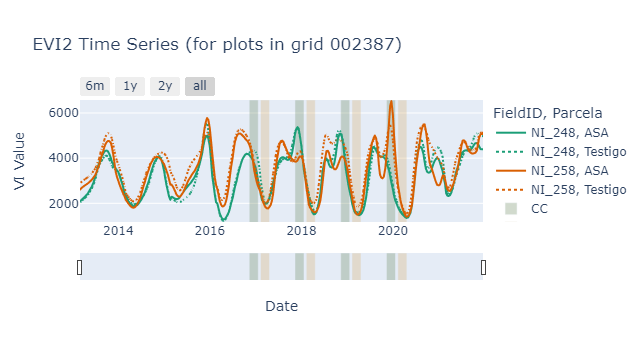

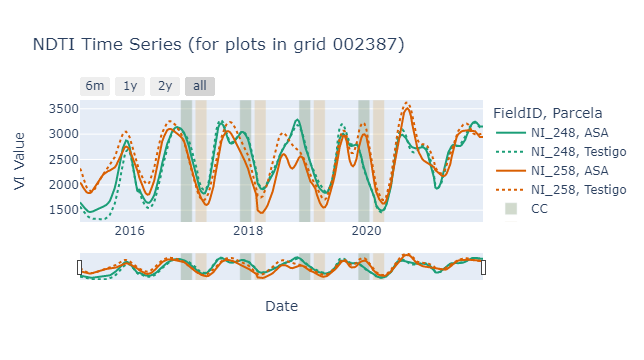

Map(center=[13.16730534800007, -86.16661184399999], close_popup_on_click=False, controls=(AttributionControl(o…

In [7]:
display_plots('002387', ['evi2', 'ndti'])

Cultivo                           \
Temporada                             Postrera Primera Postrera Primera   
Ano                                       2016    2016     2017    2017   
ID_Prod Parcela Nom.Cob                                                   
NI_147  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz   
NI_192  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz   
NI_218  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz   

                                                                         
Temporada                             Postrera Primera Postrera Primera  
Ano                                       2018    2018     2019    2019  
ID_Prod Parcela Nom.Cob                                                  
NI_147  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol  Frijol  
        Testigo no                      Frijol    Maiz   Frijol  Frijol  
NI_192  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz  
        Testigo no                      Frijol    Maiz   Frijol    Maiz  
NI_218  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz  
        Testigo no                      Frijol    Maiz   Frijol    Maiz

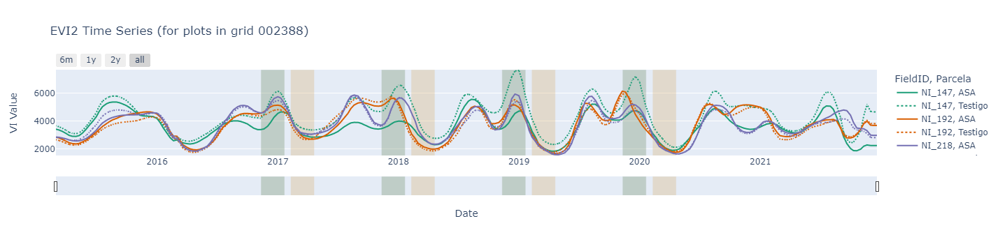

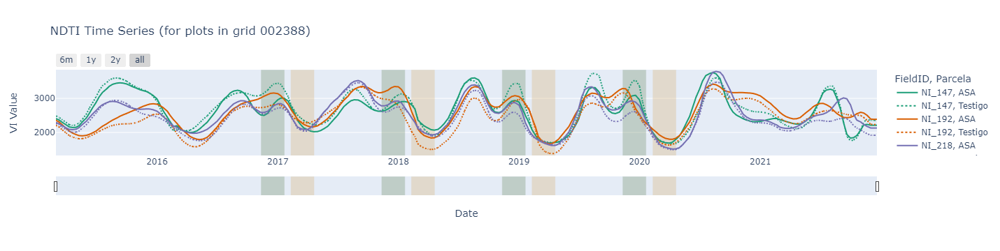

Map(center=[13.153353148000065, -86.04810727599994], close_popup_on_click=False, controls=(AttributionControl(…

In [8]:
display_plots('002388', ['evi2', 'ndti'])

Cultivo                           \
Temporada                             Postrera Primera Postrera Primera   
Ano                                       2016    2016     2017    2017   
ID_Prod Parcela Nom.Cob                                                   
NI_480  ASA     maíz-frijol-canavalia   Frijol    Maiz     Maiz  Frijol   
        Testigo no                      Frijol    Maiz     Maiz  Frijol   
NI_660  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz   
NI_697  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz   

                                                                         
Temporada                             Postrera Primera Postrera Primera  
Ano                                       2018    2018     2019    2019  
ID_Prod Parcela Nom.Cob                                                  
NI_480  ASA     maíz-frijol-canavalia    Sorgo  Frijol   Frijol  Frijol  
        Testigo no                       Sorgo  Frijol   Frijol  Frijol  
NI_660  ASA     maíz-frijol-canavalia   Frijol  Frijol   Frijol    Maiz  
        Testigo no                      Frijol  Frijol   Frijol    Maiz  
NI_697  ASA     maíz-frijol-canavalia   Frijol  Frijol   Frijol  Frijol  
        Testigo no                      Frijol  Frijol   Frijol  Frijol

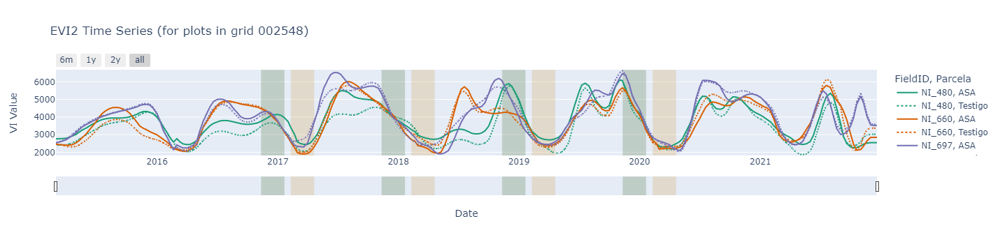

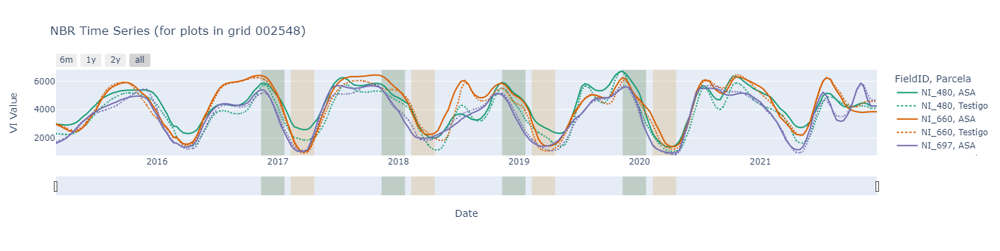

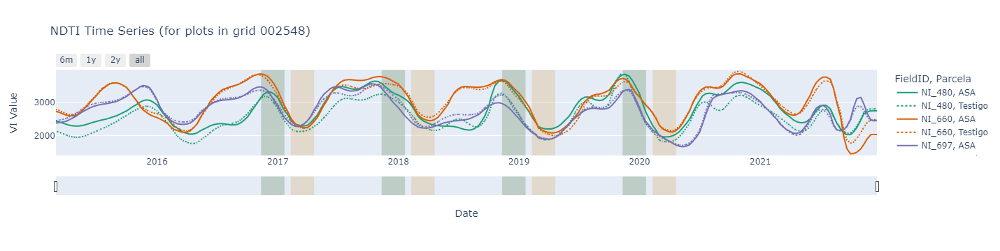

Map(center=[12.831611139000074, -86.01258599099998], close_popup_on_click=False, controls=(AttributionControl(…

In [9]:
display_plots('002548', ['evi2',  'nbr', 'ndti'])

Cultivo                           \
Temporada                             Postrera Primera Postrera Primera   
Ano                                       2016    2016     2017    2017   
ID_Prod Parcela Nom.Cob                                                   
NI_470  ASA     maíz-frijol-canavalia     Maiz  Frijol    Sorgo  Frijol   
        Testigo no                        Maiz  Frijol    Sorgo  Frijol   
NI_482  ASA     maíz-frijol-canavalia   Frijol    Maiz     Maiz  Frijol   
        Testigo no                      Frijol    Maiz     Maiz  Frijol   
NI_599  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol  Frijol   
        Testigo no                      Frijol    Maiz   Frijol  Frijol   
NI_634  ASA     maíz-frijol-canavalia    Sorgo    Maiz     Maiz  Frijol   
        Testigo no                       Sorgo    Maiz     Maiz  Frijol   
NI_698  ASA     maíz-frijol-canavalia   Frijol    Maiz    Sorgo  Frijol   
        Testigo no                      Frijol    Maiz    Sorgo  Frijol   

                                                                         
Temporada                             Postrera Primera Postrera Primera  
Ano                                       2018    2018     2019    2019  
ID_Prod Parcela Nom.Cob                                                  
NI_470  ASA     maíz-frijol-canavalia    Sorgo  Frijol   Frijol    Maiz  
        Testigo no                       Sorgo  Frijol   Frijol    Maiz  
NI_482  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz  
        Testigo no                      Frijol    Maiz   Frijol    Maiz  
NI_599  ASA     maíz-frijol-canavalia    Sorgo  Frijol   Frijol    Maiz  
        Testigo no                       Sorgo  Frijol   Frijol    Maiz  
NI_634  ASA     maíz-frijol-canavalia    Sorgo  Frijol     Maiz  Frijol  
        Testigo no                       Sorgo  Frijol     Maiz  Frijol  
NI_698  ASA     maíz-frijol-canavalia    Sorgo    Maiz   Frijol    Maiz  
        Testigo no                       Sorgo    Maiz   Frijol    Maiz

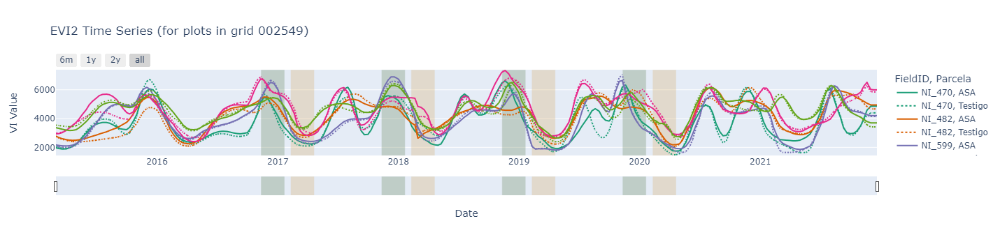

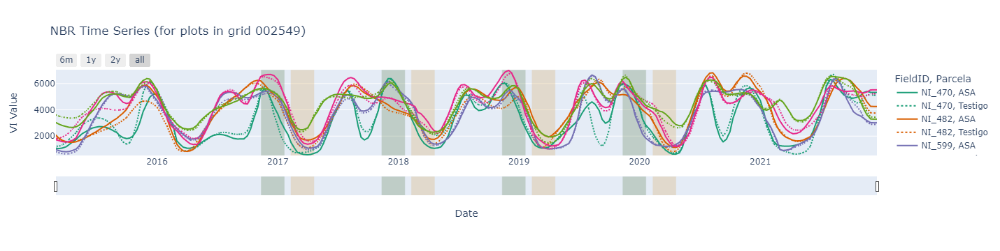

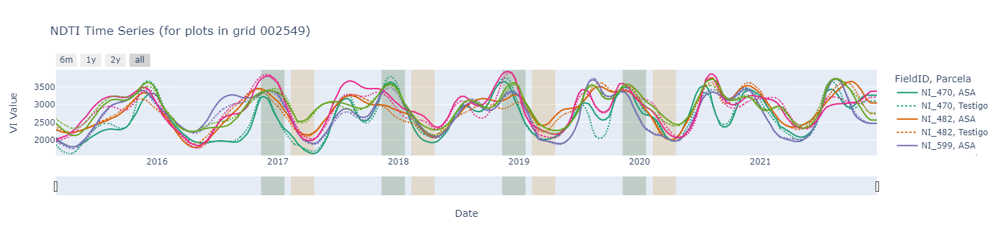

Map(center=[12.80290309000003, -85.87283680899998], close_popup_on_click=False, controls=(AttributionControl(o…

In [5]:
display_plots('002549',  ['evi2',  'nbr', 'ndti'])

Cultivo                                 \
Temporada                             Postrera Primera Postrera Primera         
Ano                                       2016    2016     2017    2017  2018   
ID_Prod Parcela Nom.Cob                                                         
NI_581  ASA     maíz-frijol-canavalia   Frijol    Maiz   Frijol    Maiz  Maiz   
        Testigo no                      Frijol    Maiz   Frijol    Maiz  Maiz   

                                                        
Temporada                             Postrera Primera  
Ano                                       2019    2019  
ID_Prod Parcela Nom.Cob                                 
NI_581  ASA     maíz-frijol-canavalia   Frijol    Maiz  
        Testigo no                      Frijol    Maiz

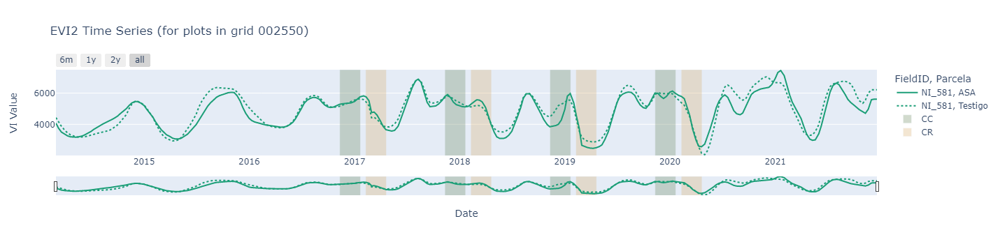

Map(center=[12.723860393000052, -85.76993944599997], close_popup_on_click=False, controls=(AttributionControl(…

In [6]:
display_plots('002550', ['evi2'])